In [21]:
!pwd

/Users/renkohkato/ds/metisgh/scrapGit/nba


In [22]:
import requests
import pandas as pd
import numpy as np

In [23]:
from sklearn.linear_model import Lasso, Ridge, LinearRegression, LogisticRegression, ElasticNet
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.cross_validation import KFold
import scipy.stats as stats
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.externals.six import StringIO
from sklearn.preprocessing import LabelEncoder, PolynomialFeatures, StandardScaler   # LabelEncoder takes a string -> Numbers
from sklearn.feature_selection import RFE

#visualization
import seaborn as sns
from IPython.display import Image
import pydotplus
from sklearn.tree import export_graphviz

# visualization
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

### Load data

In [24]:
DF_Modeling = np.load('data/DF_Modeling.pkl')
data_advanced_15_17 = np.load('data/data_advanced_15_17.pkl')
data_per_min_15_17 = np.load('data/data_per_min_15_17.pkl')

#### Data Visualization

In [25]:
DF_Modeling.head()

,NAME,TEAM,SALARY,Contract_Yr,Year,Player_Match,bling1,bling2,name,weight,...,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd
0,"Stephen Curry, PG",Golden State Warriors,34382550.0,2018,2017,STEPHEN CURRY,4x All Star,2015-16 NBA Scoring Champ,Stephen Curry,190.0,...,0,34.382550,34382550.0,34.382550,17.353060,17.353060,0,0,1,0
1,"LeBron James, SF",Cleveland Cavaliers,33285709.0,2018,2017,LEBRON JAMES,13x All Star,2007-08 NBA Scoring Champ,LeBron James,250.0,...,0,33.285709,33285709.0,33.285709,17.320639,17.320639,0,0,0,1
2,"Paul Millsap, PF",Denver Nuggets,31269231.0,2018,2017,PAUL MILLSAP,4x All Star,2015-16 All-Defensive,Paul Millsap,246.0,...,0,31.269231,31269231.0,31.269231,17.258145,17.258145,0,1,0,0
3,"Gordon Hayward, SF",Boston Celtics,29727900.0,2018,2017,GORDON HAYWARD,1x All Star,None,Gordon Hayward,226.0,...,0,29.727900,29727900.0,29.727900,17.207597,17.207597,0,0,0,1
4,"Blake Griffin, PF",LA Clippers,29512900.0,2018,2017,BLAKE GRIFFIN,5x All Star,4x All-NBA,Blake Griffin,251.0,...,0,29.512900,29512900.0,29.512900,17.200338,17.200338,0,1,0,0


In [26]:
DF_Modeling.shape

(1048, 114)

In [27]:
# drop one year Stat values
drop_cols = list(data_advanced_15_17.columns[1:])
drop_cols2 = list(data_per_min_15_17.columns[3:-1])
#drop_cols3 = ['bling1', 'bling2']

DF_Modeling2 = DF_Modeling.drop(drop_cols, 1)
DF_Modeling2.drop(drop_cols2, 1, inplace=True)

# NEED TO DROP MORE COLUMNS
#data_per_min_15_17

### Keep only Players with 2 or more years of experience

In [28]:
DF_Modeling3 = DF_Modeling2[DF_Modeling2['Exp_Yrs_Real'] >= 2]
DF_Modeling3.head()

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,...,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd
0,"Stephen Curry, PG",Golden State Warriors,34382550.0,2018,STEPHEN CURRY,4x All Star,2015-16 NBA Scoring Champ,Stephen Curry,190.0,75.0,...,0,34.382550,34382550.0,34.382550,17.353060,17.353060,0,0,1,0
1,"LeBron James, SF",Cleveland Cavaliers,33285709.0,2018,LEBRON JAMES,13x All Star,2007-08 NBA Scoring Champ,LeBron James,250.0,80.0,...,0,33.285709,33285709.0,33.285709,17.320639,17.320639,0,0,0,1
2,"Paul Millsap, PF",Denver Nuggets,31269231.0,2018,PAUL MILLSAP,4x All Star,2015-16 All-Defensive,Paul Millsap,246.0,80.0,...,0,31.269231,31269231.0,31.269231,17.258145,17.258145,0,1,0,0
3,"Gordon Hayward, SF",Boston Celtics,29727900.0,2018,GORDON HAYWARD,1x All Star,None,Gordon Hayward,226.0,80.0,...,0,29.727900,29727900.0,29.727900,17.207597,17.207597,0,0,0,1
4,"Blake Griffin, PF",LA Clippers,29512900.0,2018,BLAKE GRIFFIN,5x All Star,4x All-NBA,Blake Griffin,251.0,82.0,...,0,29.512900,29512900.0,29.512900,17.200338,17.200338,0,1,0,0


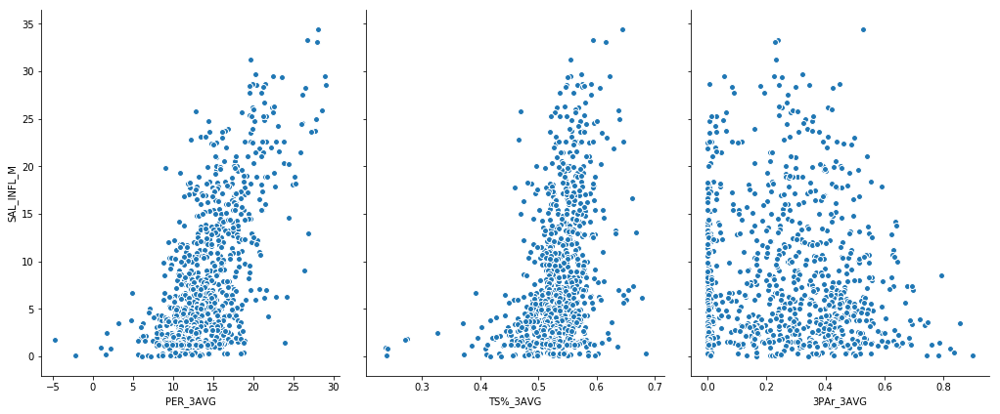

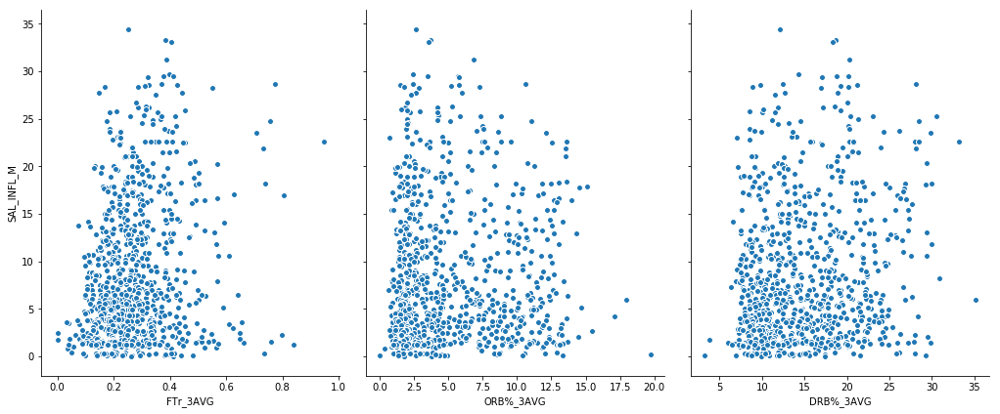

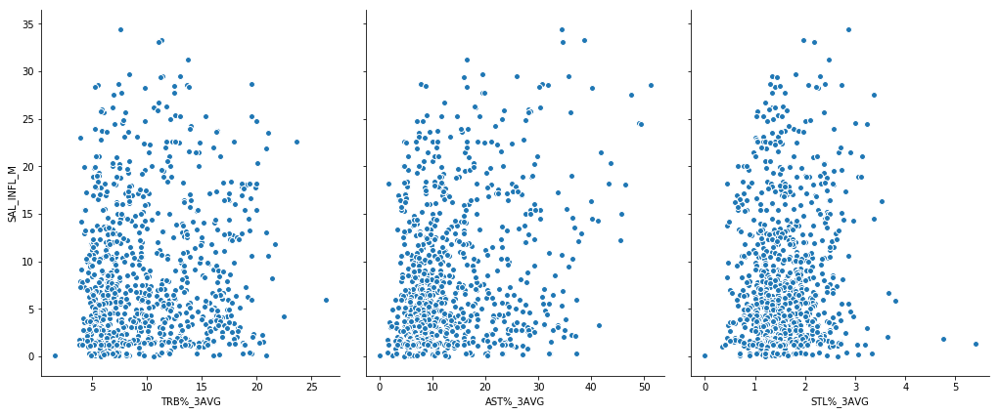

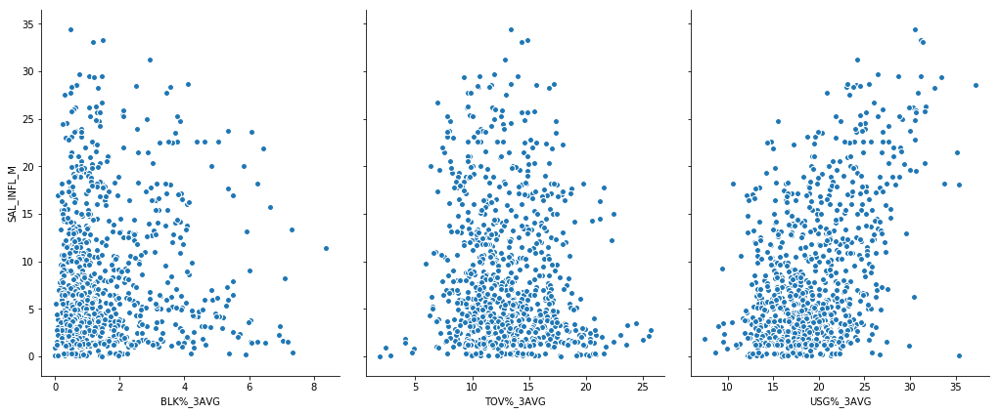

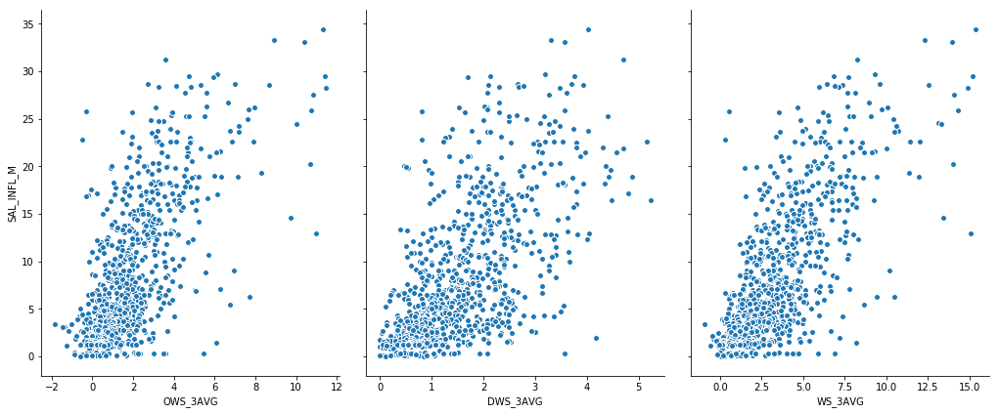

...

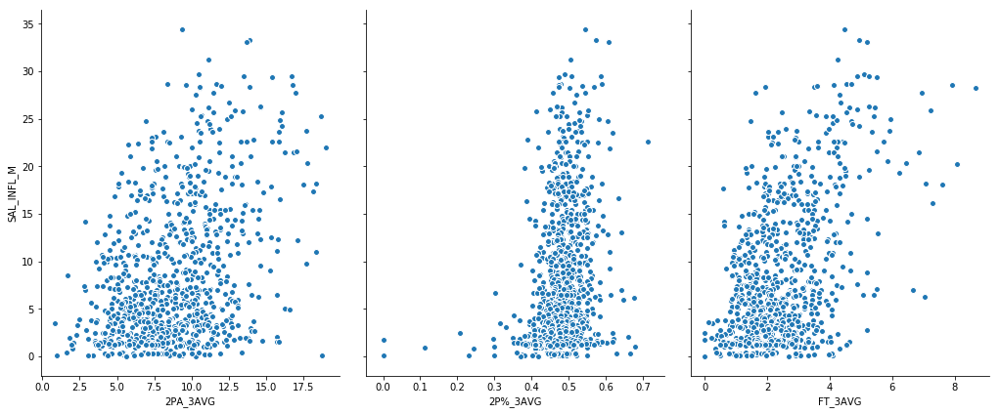

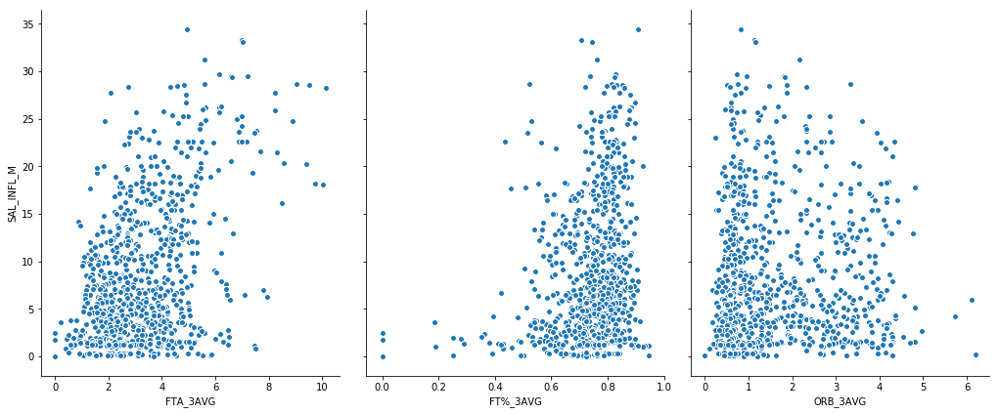

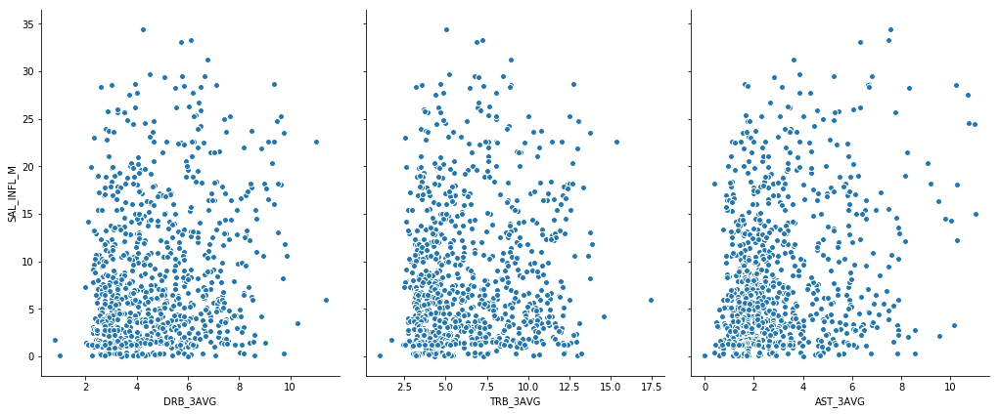

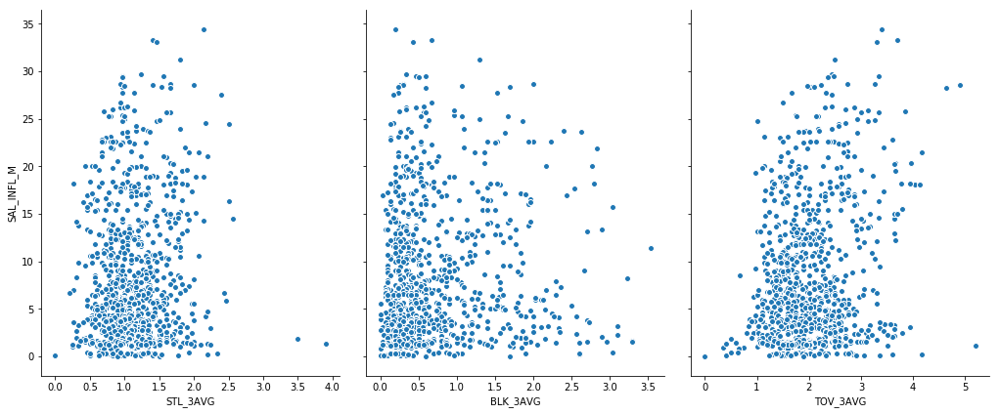

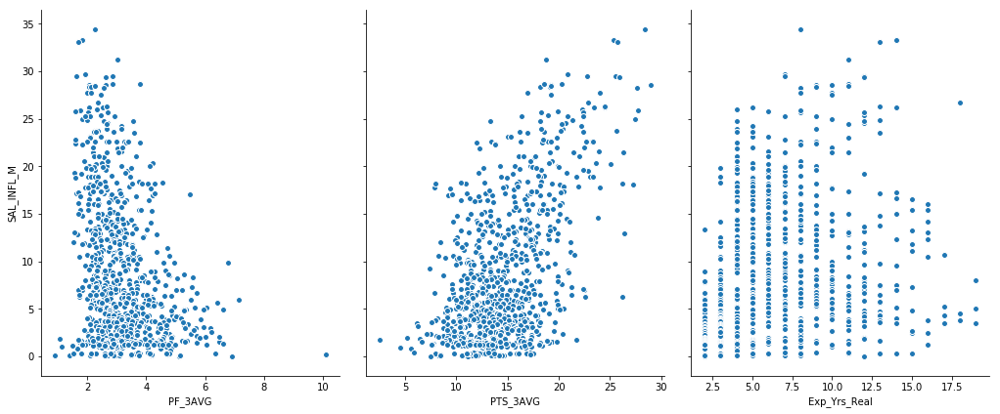

In [29]:
for i in range(13, 56, 3):
    sns.pairplot(DF_Modeling3, x_vars=DF_Modeling3.columns.tolist()[i:i+3], 
                     y_vars='SAL_INFL_M', size=6, aspect=0.8)

### Variable Reduction

In [30]:
auto_correlations = DF_Modeling3.corr()

In [31]:
abs(auto_correlations)

,SALARY,Contract_Yr,weight,height_in,College_Ind,Award_Ind,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,...,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd
SALARY,1.000000,0.199847,0.088448,0.053132,0.098489,0.349751,0.612369,0.359339,0.110079,0.201556,...,0.369168,1.000000,0.988602,0.988602,0.823907,0.814672,0.044133,0.009403,0.006418,0.022118
Contract_Yr,0.199847,1.000000,0.016232,0.016231,0.027403,0.045229,0.028819,0.012035,0.072548,0.014789,...,0.025299,0.199847,0.089422,0.089422,0.161662,0.077358,0.023385,0.027511,0.016820,0.032434
weight,0.088448,0.016232,1.000000,0.833064,0.152397,0.002943,0.208414,0.192753,0.497405,0.286902,...,0.094697,0.088448,0.093890,0.093890,0.078595,0.080999,0.569153,0.373070,0.595620,0.002770
height_in,0.053132,0.016231,0.833064,1.000000,0.202946,0.071897,0.129109,0.199231,0.460276,0.278249,...,0.064449,0.053132,0.054123,0.054123,0.056868,0.056131,0.580124,0.342959,0.664967,0.072212
College_Ind,0.098489,0.027403,0.152397,0.202946,1.000000,0.097081,0.115917,0.139863,0.138202,0.163460,...,0.060135,0.098489,0.099922,0.099922,0.118588,0.117322,0.216794,0.021180,0.032962,0.055579
Award_Ind,0.349751,0.045229,0.002943,0.071897,0.097081,1.000000,0.405055,0.194914,0.105118,0.154435,...,0.244661,0.349751,0.362349,0.362349,0.313315,0.320385,0.057741,0.080963,0.120698,0.082245
PER_3AVG,0.612369,0.028819,0.208414,0.129109,0.115917,0.405055,1.000000,0.623484,0.370234,0.389954,...,0.323983,0.612369,0.627964,0.627964,0.525090,0.533661,0.251174,0.030277,0.072341,0.136636
TS%_3AVG,0.359339,0.012035,0.192753,0.199231,0.139863,0.194914,0.623484,1.000000,0.068863,0.281830,...,0.205373,0.359339,0.360099,0.360099,0.352154,0.357448,0.214562,0.019410,0.142415,0.005136
3PAr_3AVG,0.110079,0.072548,0.497405,0.460276,0.138202,0.105118,0.370234,0.068863,1.000000,0.548049,...,0.125459,0.110079,0.121982,0.121982,0.115689,0.122635,0.571048,0.160122,0.123808,0.274140
FTr_3AVG,0.201556,0.014789,0.286902,0.278249,0.163460,0.154435,0.389954,0.281830,0.548049,1.000000,...,0.135158,0.201556,0.205281,0.205281,0.113208,0.115604,0.391363,0.013368,0.065014,0.100769


In [32]:
(abs(auto_correlations['SAL_INFL_M']).sort_values(ascending=False))

SAL_INFL_M      1.000000
SAL_INFL        1.000000
SALARY          0.988602
SALARY_M        0.988602
Log_SAL_INFL    0.827058
Log_SAL         0.826306
WS_3AVG         0.725921
OWS_3AVG        0.676837
VORP_3AVG       0.673887
PER_3AVG        0.627964
GS_3AVG         0.621965
DWS_3AVG        0.621452
MP_3AVG         0.616440
BPM_3AVG        0.610821
OBPM_3AVG       0.578188
PTS_3AVG        0.547113
WS/48_3AVG      0.528377
FG_3AVG         0.516187
FT_3AVG         0.493116
USG%_3AVG       0.466773
FTA_3AVG        0.448752
2P_3AVG         0.419207
FGA_3AVG        0.413226
Bench_Player    0.380054
2PA_3AVG        0.379456
Award_Ind       0.362349
TS%_3AVG        0.360099
G_3AVG          0.338715
PF_3AVG         0.328280
AST%_3AVG       0.283698
                  ...   
FG%_3AVG        0.250804
AST_3AVG        0.234703
2P%_3AVG        0.233730
TOV_3AVG        0.229700
DBPM_3AVG       0.223456
FT%_3AVG        0.216898
FTr_3AVG        0.205281
DRB_3AVG        0.155760
DRB%_3AVG       0.147822


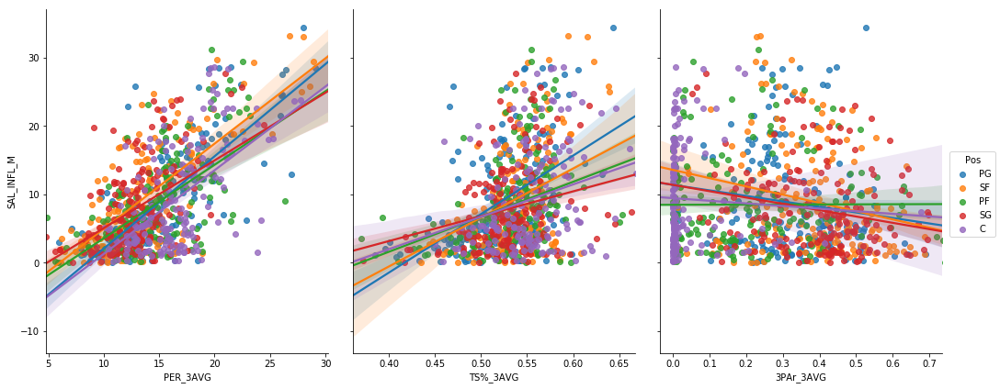

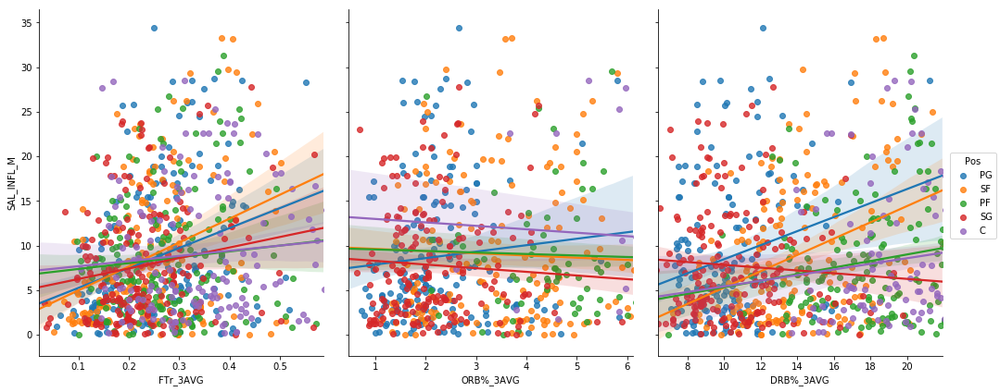

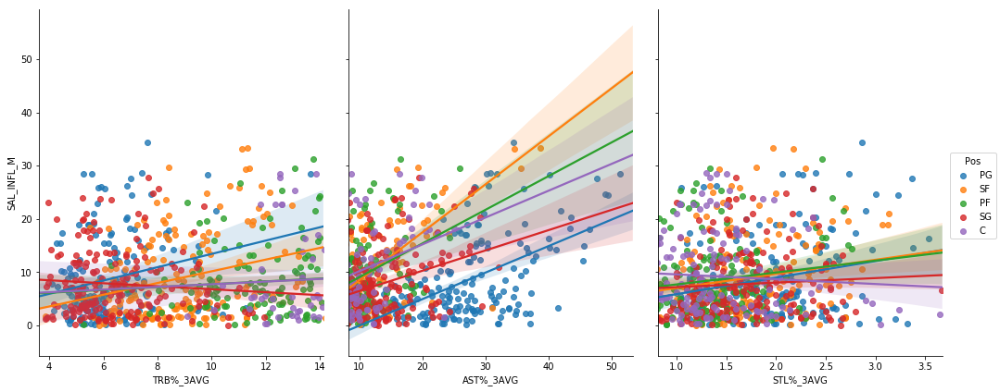

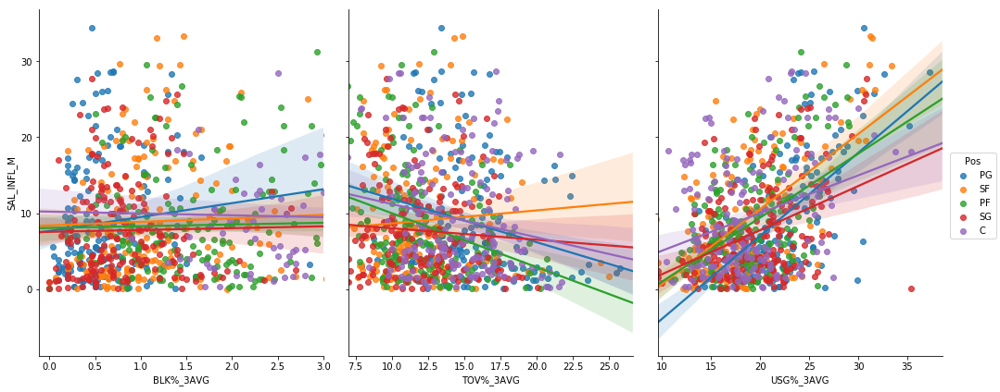

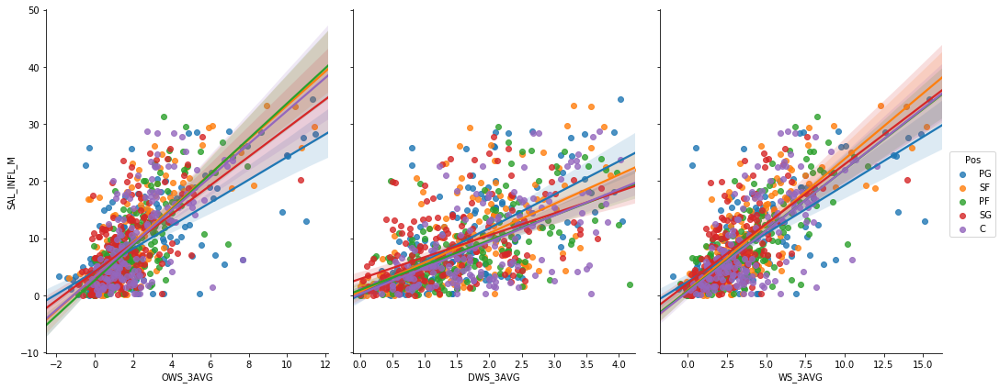

...

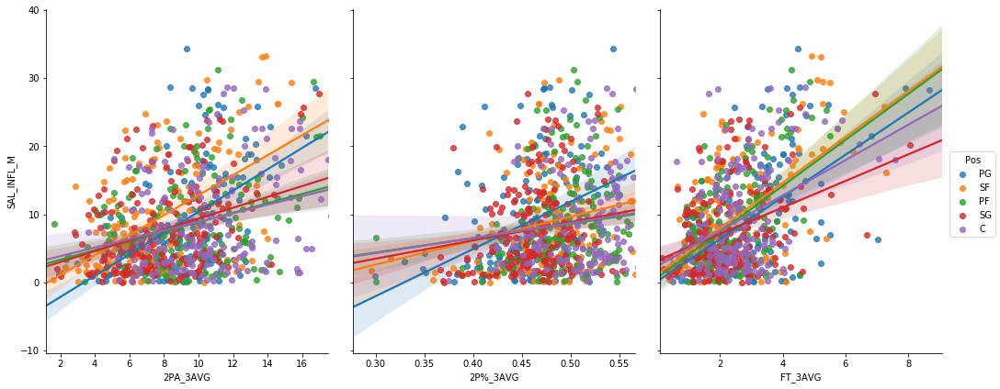

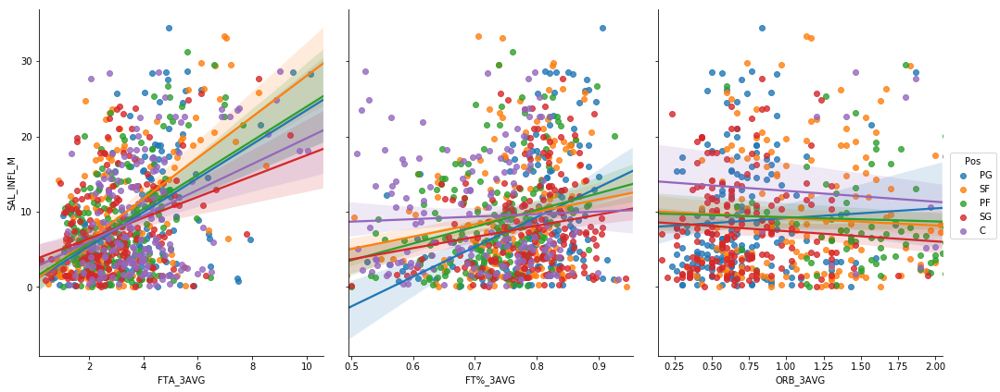

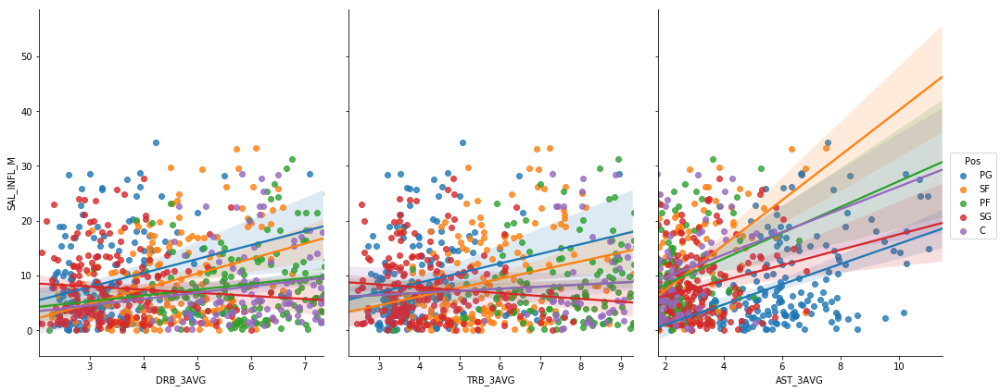

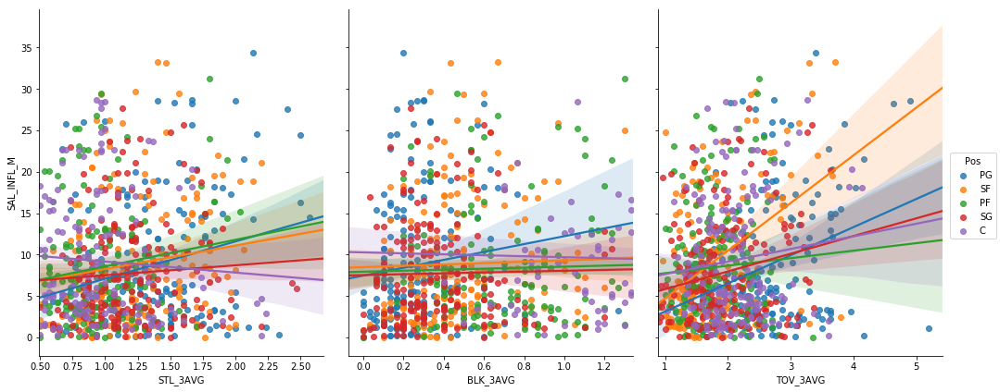

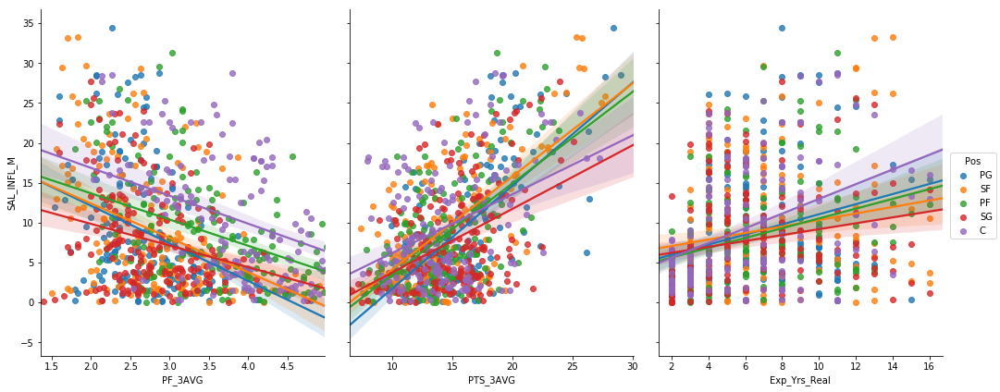

In [33]:
for i in range(13, 56, 3):
    sns.pairplot(DF_Modeling3, x_vars=DF_Modeling3.columns.tolist()[i:i+3], 
                     y_vars='SAL_INFL_M',hue = 'Pos', size=6, aspect=0.8, kind='reg')

### Remove Variables that have < 0.3 Correlation to Target Variable (SAL_INFL)

In [180]:
x = pd.DataFrame(abs(auto_correlations['SAL_INFL']).sort_values(ascending=False)).reset_index()

In [181]:
drop_vars = x[x['SAL_INFL'] < 0.2]['index'].tolist()

In [182]:
x

,index,SAL_INFL
0,SAL_INFL,1.000000
1,SAL_INFL_M,1.000000
2,SALARY,0.988602
3,SALARY_M,0.988602
4,Log_SAL_INFL,0.827058
5,Log_SAL,0.826306
6,WS_3AVG,0.725921
7,OWS_3AVG,0.676837
8,VORP_3AVG,0.673887
9,PER_3AVG,0.627964


In [188]:
var_keep = x[x['SAL_INFL'] > 0.3]['index'].tolist()[6:]

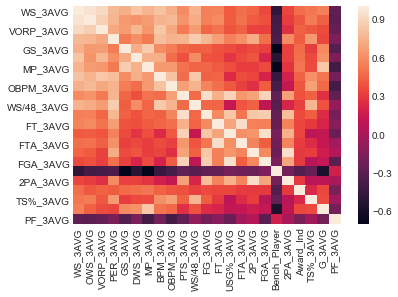

In [189]:
sns.heatmap(DF_Modeling2[var_keep].corr());

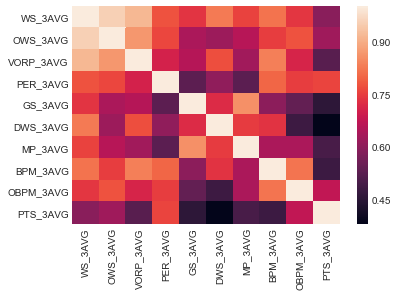

In [190]:
sns.heatmap(DF_Modeling2[var_keep[:10]].corr());

### Recursive feature elimination (RFE) with n features
http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

In [191]:
LRmodel = LinearRegression()
num_features = 7

# create the RFE model and select num_features attributes
rfe = RFE(LRmodel, num_features)
rfe = rfe.fit(DF_Modeling3[var_keep], DF_Modeling3.SAL_INFL, )
# summarize the selection of the attributes
print(rfe.support_)
print(rfe.ranking_)

[ True  True False False False  True False False False False  True  True
 False False False False False  True False False False False  True]
[ 1  1 11  7 15  1 17  2 13  9  1  1  8  6 16  3  5  1  4 10 12 14  1]


In [192]:
sorted(list(zip((rfe.ranking_).tolist(), var_keep)))

[(1, 'Bench_Player'),
 (1, 'DWS_3AVG'),
 (1, 'FG_3AVG'),
 (1, 'OWS_3AVG'),
 (1, 'PF_3AVG'),
 (1, 'WS/48_3AVG'),
 (1, 'WS_3AVG'),
 (2, 'BPM_3AVG'),
 (3, '2P_3AVG'),
 (4, '2PA_3AVG'),
 (5, 'FGA_3AVG'),
 (6, 'USG%_3AVG'),
 (7, 'PER_3AVG'),
 (8, 'FT_3AVG'),
 (9, 'PTS_3AVG'),
 (10, 'Award_Ind'),
 (11, 'VORP_3AVG'),
 (12, 'TS%_3AVG'),
 (13, 'OBPM_3AVG'),
 (14, 'G_3AVG'),
 (15, 'GS_3AVG'),
 (16, 'FTA_3AVG'),
 (17, 'MP_3AVG')]

In [193]:
best_predictors_tuple = sorted(list(zip((rfe.ranking_).tolist(), var_keep)))[:num_features]
best_predictors_tuple

[(1, 'Bench_Player'),
 (1, 'DWS_3AVG'),
 (1, 'FG_3AVG'),
 (1, 'OWS_3AVG'),
 (1, 'PF_3AVG'),
 (1, 'WS/48_3AVG'),
 (1, 'WS_3AVG')]

In [194]:
# create a list of the best n features
best_predictors = [x[1] for x in best_predictors_tuple]
best_predictors

['Bench_Player',
 'DWS_3AVG',
 'FG_3AVG',
 'OWS_3AVG',
 'PF_3AVG',
 'WS/48_3AVG',
 'WS_3AVG']

### Decision Tree

In [195]:
X_all_cols = DF_Modeling3.columns.tolist()[8:12] + \
             DF_Modeling3.columns.tolist()[13:35]+\
             DF_Modeling3.columns.tolist()[-4:]
#              DF_Modeling2.columns.tolist()[14:-7] + \
        
X_mult_all = DF_Modeling3[X_all_cols]
X_mult_all.head()

,weight,height_in,College_Ind,Award_Ind,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,ORB%_3AVG,DRB%_3AVG,TRB%_3AVG,AST%_3AVG,STL%_3AVG,BLK%_3AVG,TOV%_3AVG,USG%_3AVG,OWS_3AVG,DWS_3AVG,WS_3AVG,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,PointG,SmallFwd,Lasso_CV_Predicted,resid
0,190.0,75.0,1.0,1.0,28.033333,0.643667,0.527667,0.250667,2.666667,12.133333,7.633333,34.500000,2.866667,0.466667,13.400000,30.533333,11.333333,4.033333,15.400000,0.278333,9.933333,0.000000,9.900000,7.966667,79.333333,79.333333,1,0,30.281256,4.101294
1,250.0,80.0,0.0,1.0,26.800000,0.594667,0.239333,0.385000,3.700000,18.700000,11.333333,38.633333,1.966667,1.466667,14.866667,31.233333,8.933333,3.300000,12.300000,0.220667,6.633333,1.700000,8.300000,6.933333,73.000000,73.000000,0,1,25.812531,7.473178
2,246.0,80.0,1.0,1.0,19.700000,0.554333,0.232667,0.387333,6.866667,20.333333,13.733333,16.566667,2.466667,2.933333,12.900000,24.166667,3.566667,4.700000,8.266667,0.160333,1.066667,2.966667,4.066667,3.766667,74.333333,73.666667,0,0,19.656952,11.612279
3,226.0,80.0,1.0,1.0,20.233333,0.573667,0.323000,0.397667,2.400000,14.300000,8.400000,19.366667,1.800000,0.766667,11.900000,26.500000,6.133333,3.200000,9.333333,0.168333,3.366667,0.000000,3.366667,3.633333,76.333333,76.333333,0,1,19.993535,9.734365
4,251.0,82.0,1.0,1.0,22.500000,0.554667,0.056000,0.376333,5.700000,20.133333,13.066667,25.966667,1.333333,1.066667,10.633333,28.733333,4.733333,2.133333,6.833333,0.172667,2.666667,1.300000,3.933333,2.866667,54.333333,54.333333,0,0,16.468158,13.044742


In [196]:
y = DF_Modeling3['SAL_INFL_M']

In [197]:
X_train, X_test, y_train, y_test = train_test_split(X_mult_all, y, test_size=0.4, random_state=20)

In [198]:
decision_tree = DecisionTreeRegressor(max_depth=2)
decision_tree.fit(X_train, y_train)
print( "Decision Tree RMSE:", np.sqrt(mean_squared_error(y_test,decision_tree.predict(X_test))))

Decision Tree RMSE: 3.97780378192


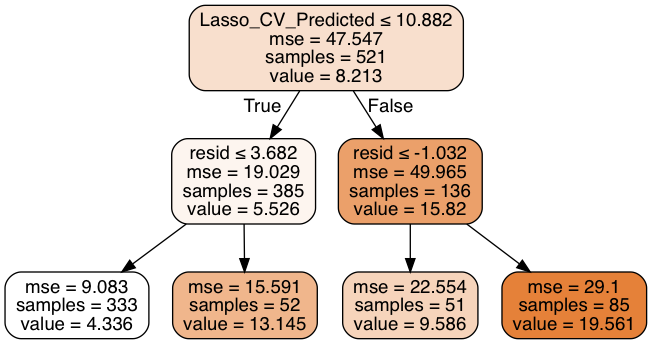

In [199]:
dot_data = StringIO()  
export_graphviz(decision_tree, out_file=dot_data,  
                    feature_names=X_train.columns.tolist(),  
                    filled=True, rounded=True,  
                    special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Decision Tree Train/Test RMSE: 5.20617858609   6.09310650113
Decision Tree Train/Test RMSE: 3.78377343897   3.97780378192
Decision Tree Train/Test RMSE: 2.9992758891   3.28104543786
Decision Tree Train/Test RMSE: 1.99077055115   2.66248186978
Decision Tree Train/Test RMSE: 1.34536507391   2.34752268452
Decision Tree Train/Test RMSE: 0.879950785814   1.95937983174
Decision Tree Train/Test RMSE: 0.551981443233   2.04732014464
Decision Tree Train/Test RMSE: 0.339684416922   1.8288492985
Decision Tree Train/Test RMSE: 0.226155498218   1.85915768679
Decision Tree Train/Test RMSE: 0.146850587574   2.00932751585


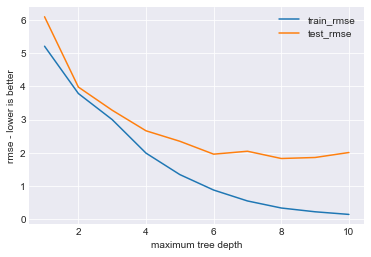

In [200]:
# Generating decision trees based on depths from 2 - 10
depths = range(1,11)

# Train error / Test Eror
train_rmse, test_rmse = [],[]
for depth in depths:
    decision_tree = DecisionTreeRegressor(max_depth=depth, random_state=10)
    decision_tree.fit(X_train, y_train)
    curr_train_rmse = np.sqrt(mean_squared_error(y_train, decision_tree.predict(X_train)))
    curr_test_rmse = np.sqrt(mean_squared_error(y_test, decision_tree.predict(X_test)))
    print( "Decision Tree Train/Test RMSE:", curr_train_rmse," ", curr_test_rmse)
    train_rmse.append(curr_train_rmse)
    test_rmse.append(curr_test_rmse)
    
plt.plot(depths,train_rmse,label='train_rmse')
plt.plot(depths,test_rmse,label='test_rmse')
plt.xlabel("maximum tree depth")
plt.ylabel("rmse - lower is better")
plt.legend();

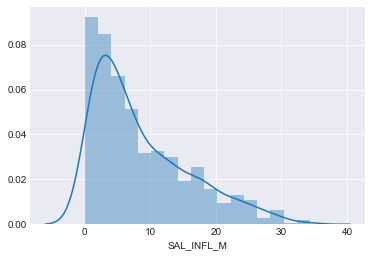

In [201]:
sns.distplot(DF_Modeling3.SAL_INFL_M);

In [202]:
# g = sns.FacetGrid(DF_Modeling3, hue='Rej_Ind', size=6)
# g.map(sns.distplot, "FICO")
# g.add_legend()

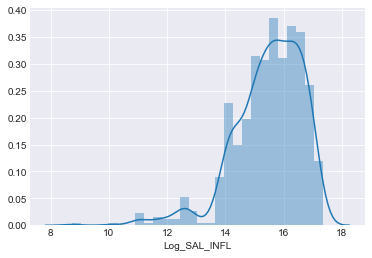

In [203]:
sns.distplot(DF_Modeling3.Log_SAL_INFL);

In [204]:
DF_Modeling3.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SALARY_M', 'SAL_INFL', 'SAL_INFL_M',
       'Log_SAL', 'Log_SAL_INFL', 'Center', 'PowerFwd', 'PointG', 'SmallFwd',
       'Lasso_CV_Predicted', 'resid'],
      dtype='object')

In [205]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)


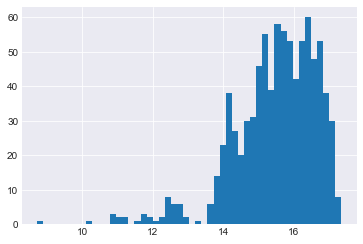

In [206]:
plt.hist(DF_Modeling3.Log_SAL_INFL, bins=50);

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


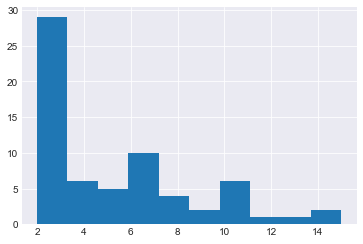

In [207]:
y = DF_Modeling3[DF_Modeling2['Log_SAL_INFL'] < 14][['NAME', 'SALARY', 'Exp_Yrs_Real', 'bling1']]
plt.hist(y.Exp_Yrs_Real);

In [208]:
y.Exp_Yrs_Real.value_counts()

2.0     16
3.0     13
4.0      6
11.0     5
6.0      5
7.0      5
5.0      5
8.0      4
9.0      2
15.0     1
14.0     1
12.0     1
13.0     1
10.0     1
Name: Exp_Yrs_Real, dtype: int64

In [209]:
# Best predictors from RFE
best_predictors

['Bench_Player',
 'DWS_3AVG',
 'FG_3AVG',
 'OWS_3AVG',
 'PF_3AVG',
 'WS/48_3AVG',
 'WS_3AVG']

### Linear Regression w/ Train/Test Split

In [210]:
X_mult = DF_Modeling3[['Bench_Player', 'PF_3AVG']]
y_mult = DF_Modeling3['SAL_INFL_M']
# Target: SALARY, Log_SAL_INFL, SAL_INFL

# 70/30 Train/Test Split
X_mult_train, X_mult_test, y_mult_train, y_mult_test = train_test_split(X_mult, y_mult, test_size=0.3, random_state=23)

# instantiate and fit like last time
multiple_linreg = LinearRegression()
multiple_linreg.fit(X_mult, y_mult)

coeffs = multiple_linreg.coef_
intercept =  multiple_linreg.intercept_
r2 = multiple_linreg.score
# print the coefficients like last time
print("interecept:", intercept)
print("coeffs:", coeffs)

#generate predictions on training set and evaluate
y_mult_pred_train = multiple_linreg.predict(X_mult_train)
print( "\nTrain set RMSE:", np.sqrt(metrics.mean_squared_error(y_mult_train, y_mult_pred_train)))

print("Train R2:", metrics.r2_score(y_mult_train, y_mult_pred_train))


#generate predictions on test set and evaluate
y_mult_pred_test = multiple_linreg.predict(X_mult_test)
print( "\nTest set RMSE:", np.sqrt(metrics.mean_squared_error(y_mult_test, y_mult_pred_test)))
print("Test R2:", metrics.r2_score(y_mult_test, y_mult_pred_test))

interecept: 16.0723857328
coeffs: [-5.66938303 -1.90856246]

Train set RMSE: 6.62169644812
Train R2: 0.221735432742

Test set RMSE: 6.1557350241
Test R2: 0.188875871701


In [211]:
# Necessary imports
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
sns.set_style("darkgrid")
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [212]:
best_predictors

['Bench_Player',
 'DWS_3AVG',
 'FG_3AVG',
 'OWS_3AVG',
 'PF_3AVG',
 'WS/48_3AVG',
 'WS_3AVG']

In [213]:
# Create your feature matrix (X) and target vector (y)
# y, X = patsy.dmatrices('SAL_INFL ~ GS_3AVG + OWS_3AVG + Exp_Yrs_Real ', data=DF_Modeling3, return_type="dataframe")
#mult_feature_cols = ['GS_3AVG', 'OWS_3AVG', 'Exp_Yrs_Real', '2P_3AVG', 'STL%_3AVG']

X = DF_Modeling3[best_predictors]
X["intercept"] = 1
y = DF_Modeling3['SAL_INFL']

model = sm.OLS(y, X)
# Fit your model to your training set
fit = model.fit()
# Print summary statistics of the model's performance
fit.summary()

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               SAL_INFL   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.568
Method:                 Least Squares   F-statistic:                     164.0
Date:                Thu, 05 Oct 2017   Prob (F-statistic):          1.14e-153
Time:                        19:01:01   Log-Likelihood:                -14600.
No. Observations:                 869   AIC:                         2.922e+04
Df Residuals:                     861   BIC:                         2.925e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Bench_Player -8.572e+05   4.41e+05     -1.943      0.052   -1.72e+06    8647.147
DWS_3AVG      1.001e+07   5.65e+06      1.772      0.077   -1.08e+06    2.11e+07
FG_3AVG       8.945e+05   1.38e+05      6.497      0.000    6.24e+05    1.16e+06
OWS_3AVG      9.071e+06   5.66e+06      1.603      0.109   -2.03e+06    2.02e+07
PF_3AVG      -6.958e+05    1.8e+05     -3.863      0.000   -1.05e+06   -3.42e+05
WS/48_3AVG   -1.055e+07   5.24e+06     -2.014      0.044   -2.08e+07   -2.69e+05
WS_3AVG        -7.6e+06   5.65e+06     -1.346      0.179   -1.87e+07    3.48e+06
intercept     4.629e+05   9.71e+05      0.477      0.634   -1.44e+06    2.37e+06
==============================================================================
Omnibus:                       41.209   Durbin-Watson:                   1.023
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               65.470
Skew:                           0.380   Prob(JB):                     6.07e-15
Kurtosis:                       4.109   Cond. No.                         489.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [214]:
DF_Modeling3['pred'] = model.predict(X)

ValueError: shapes (869,8) and (869,8) not aligned: 8 (dim 1) != 869 (dim 0)

In [215]:
DF_Modeling3.columns

Index(['NAME', 'TEAM', 'SALARY', 'Contract_Yr', 'Player_Match', 'bling1',
       'bling2', 'name', 'weight', 'height_in', 'College_Ind', 'Award_Ind',
       'Pos', 'PER_3AVG', 'TS%_3AVG', '3PAr_3AVG', 'FTr_3AVG', 'ORB%_3AVG',
       'DRB%_3AVG', 'TRB%_3AVG', 'AST%_3AVG', 'STL%_3AVG', 'BLK%_3AVG',
       'TOV%_3AVG', 'USG%_3AVG', 'OWS_3AVG', 'DWS_3AVG', 'WS_3AVG',
       'WS/48_3AVG', 'OBPM_3AVG', 'DBPM_3AVG', 'BPM_3AVG', 'VORP_3AVG',
       'G_3AVG', 'GS_3AVG', 'MP_3AVG', 'FG_3AVG', 'FGA_3AVG', 'FG%_3AVG',
       '3P_3AVG', '3PA_3AVG', '3P%_3AVG', '2P_3AVG', '2PA_3AVG', '2P%_3AVG',
       'FT_3AVG', 'FTA_3AVG', 'FT%_3AVG', 'ORB_3AVG', 'DRB_3AVG', 'TRB_3AVG',
       'AST_3AVG', 'STL_3AVG', 'BLK_3AVG', 'TOV_3AVG', 'PF_3AVG', 'PTS_3AVG',
       'Exp_Yrs_Real', 'Bench_Player', 'SALARY_M', 'SAL_INFL', 'SAL_INFL_M',
       'Log_SAL', 'Log_SAL_INFL', 'Center', 'PowerFwd', 'PointG', 'SmallFwd',
       'Lasso_CV_Predicted', 'resid'],
      dtype='object')

In [216]:
X_mult = DF_Modeling3[best_predictors]
y_mult = DF_Modeling3['SAL_INFL']


In [217]:
y_mult_pred = multiple_linreg.predict(X_mult)
metrics.r2_score(y_mult, y_mult_pred)

ValueError: shapes (869,7) and (2,) not aligned: 7 (dim 1) != 2 (dim 0)

In [218]:
X_train, X_test, y_train, y_test = train_test_split(X_mult, y_mult)

model= LinearRegression()
model.fit(X_train,y_train)
print(f"train r2: {model.score(X_train,y_train):.2%}, "
      f"test r2: {model.score(X_test,y_test):.2%}")

train r2: 58.46%, test r2: 52.55%


### Cross Validation

In [219]:
from sklearn.cross_validation import cross_val_score

In [220]:
best_predictors

['Bench_Player',
 'DWS_3AVG',
 'FG_3AVG',
 'OWS_3AVG',
 'PF_3AVG',
 'WS/48_3AVG',
 'WS_3AVG']

In [221]:
mult_feature_cols = best_predictors
X_mult = DF_Modeling3[mult_feature_cols]
y_mult = DF_Modeling3['SAL_INFL']
# Log_SAL_INFL, SAL_INFL

In [222]:
# 10-fold cross-validation with our fake data
reg = LinearRegression()
scores = cross_val_score(reg, X_mult, y_mult, cv=10, scoring='neg_mean_squared_error')

# scores output is negative, a sklearn quirk bc mse is used to min. optimization func.
print(-scores)
print(np.sqrt(-scores))
print(np.mean(np.sqrt(-scores)))

[  6.05526006e+13   1.70535477e+13   1.39124837e+13   4.10058307e+13
   2.16882985e+13   1.26697497e+13   3.10792325e+13   2.17571215e+13
   1.52445043e+13   2.40958744e+13]
[ 7781555.15359895  4129594.13042625  3729944.20028943  6403579.52005994
  4657069.72946776  3559459.18776493  5574875.11371619  4664452.96647378
  3904421.12468549  4908754.87423652]
4931370.60007


In [223]:
from sklearn.model_selection import cross_val_score, train_test_split


#### Lasso Regression - Check to see if I can remove redudant variables

In [224]:
### axis = 1, MAX

### for normalization

# look at p-values
# or use regularization

In [293]:
best_predictors

['Bench_Player',
 'DWS_3AVG',
 'FG_3AVG',
 'OWS_3AVG',
 'PF_3AVG',
 'WS/48_3AVG',
 'WS_3AVG']

### Try polynomials - overfit model

In [308]:
mult_feature_cols = best_predictors
# var_keep
# best_predictors
X_mult = DF_Modeling3[mult_feature_cols]

#generate the polynomial transformer
pf_2 = PolynomialFeatures(degree=2, interaction_only=False)

#apply it to the data, but ignore the first constant column
pf_2_data = pf_2.fit_transform(X_mult)

y_mult = DF_Modeling3['SAL_INFL_M']
# Log_SAL_INFL
y_mult = y_mult.values.reshape(-1,1)

In [309]:
len(mult_feature_cols)

7

In [310]:
print(y_mult.shape, X_mult.shape, pf_2_data.shape)

(869, 1) (869, 7) (869, 36)


In [311]:
from sklearn.linear_model import LassoCV

In [312]:

#2 degree polynomials
# y_mult2 = ravel(y_mult)
X_train_Poly, X_test_Poly, y_train_Poly, y_test_Poly = train_test_split(pf_2_data, y_mult, test_size=0.3)


#y_mult2.shape

In [313]:
lcv_overfit = LassoCV(cv = 8, normalize=True)


lcv_overfit.fit(X_train_Poly, y_train_Poly)
lcv_overfit.score(X_test_Poly, y_test_Poly)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:1094: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


0.61579787332992153

In [230]:
X_test

,Bench_Player,DWS_3AVG,FG_3AVG,OWS_3AVG,PF_3AVG,WS/48_3AVG,WS_3AVG
519,0,0.400000,6.700000,1.850000,2.400000,0.058500,2.250000e+00
456,0,2.300000,8.333333,6.650000,2.366667,0.172000,8.950000e+00
71,0,2.066667,3.500000,1.066667,2.833333,0.091333,3.166667e+00
261,0,0.750000,4.800000,1.000000,3.150000,0.093000,1.800000e+00
190,0,1.666667,5.966667,1.166667,4.333333,0.102000,2.833333e+00
813,0,0.850000,5.700000,0.650000,4.700000,0.102500,1.500000e+00
1180,0,0.200000,3.033333,0.000000,3.366667,-0.014667,2.333333e-01
1149,0,1.750000,6.150000,1.500000,5.600000,0.110500,3.250000e+00
632,0,2.600000,4.366667,1.900000,2.666667,0.103250,4.500000e+00
1013,0,1.566667,5.266667,3.100000,3.000000,0.122000,4.666667e+00


In [320]:

X_train, X_test, y_train, y_test = train_test_split(X_mult, y_mult, test_size=0.3)


In [321]:
print(y_test.shape, X_test.shape)

(261, 1) (261, 7)


In [325]:
X_test.head()

,Bench_Player,DWS_3AVG,FG_3AVG,OWS_3AVG,PF_3AVG,WS/48_3AVG,WS_3AVG
290,0,0.650,7.150000,1.250000,3.500000,0.039000,1.950000
96,0,1.300,5.866667,1.466667,3.233333,0.088667,2.766667
595,0,1.925,4.333333,2.025000,2.966667,0.110750,3.950000
1143,0,0.800,5.733333,1.266667,3.466667,0.063667,2.100000
106,0,2.000,6.300000,1.933333,4.800000,0.129333,3.933333


### Try LassoCV

In [322]:
from sklearn.linear_model import LassoCV

In [323]:
lcv = LassoCV(cv = 8, normalize=True)

In [324]:

lcv.fit(X_train, y_train)
lcv.score(X_test, y_test)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:1094: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


0.60814572582776094

In [236]:
best_predictors

['Bench_Player',
 'DWS_3AVG',
 'FG_3AVG',
 'OWS_3AVG',
 'PF_3AVG',
 'WS/48_3AVG',
 'WS_3AVG']

In [237]:
#lcv.mse_path_

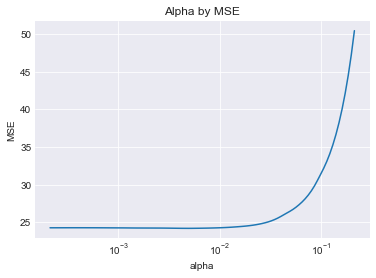

In [238]:
plot(lcv.alphas_, lcv.mse_path_.mean(axis=1))
xscale("log")
plt.title("Alpha by MSE")
plt.ylabel("MSE")
plt.xlabel("alpha");

In [239]:
lcv.alpha_

0.0049182580338421331

In [240]:
best_predictors
#var_keep

['Bench_Player',
 'DWS_3AVG',
 'FG_3AVG',
 'OWS_3AVG',
 'PF_3AVG',
 'WS/48_3AVG',
 'WS_3AVG']

In [241]:
lcv.coef_

array([-0.55769882,  0.92762617,  0.91704602,  0.        , -0.68029352,
       -0.        ,  1.22304857])

In [242]:
sorted(list(zip((lcv.coef_), best_predictors)), reverse=True)

#best_predictors_tuple = sorted(list(zip((rfe.ranking_).tolist(), var_keep)))[:num_features]

[(1.2230485681178711, 'WS_3AVG'),
 (0.92762617173285355, 'DWS_3AVG'),
 (0.91704602026104176, 'FG_3AVG'),
 (-0.0, 'WS/48_3AVG'),
 (0.0, 'OWS_3AVG'),
 (-0.5576988185336994, 'Bench_Player'),
 (-0.68029352267658594, 'PF_3AVG')]

In [259]:
print("Coeff: ", lcv.coef_)
print("\nIntercept: ", lcv.intercept_)

Coeff:  [-0.55769882  0.92762617  0.91704602  0.         -0.68029352 -0.
  1.22304857]

Intercept:  -0.000697981287715


In [260]:
DF_Modeling3["Lasso_CV_Predicted"] = lcv.predict(X_mult)
DF_Modeling3["resid"] = DF_Modeling3['SAL_INFL_M'] - DF_Modeling3['Lasso_CV_Predicted']
# Log_SAL_INFL
#DF_Modeling3.head()

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [292]:
DF_Modeling3[DF_Modeling3['Contract_Yr'] == 2018].sort_values('resid')[['NAME', 'TEAM','bling1','bling2', "SAL_INFL_M","Lasso_CV_Predicted", 'resid' ]]

,NAME,TEAM,bling1,bling2,SAL_INFL_M,Lasso_CV_Predicted,resid
168,"Karl-Anthony Towns, C",Minnesota Timberwolves,2015-16 All-Rookie,2015-16 ROY,6.216840,21.595007,-15.378167
351,"Nikola Jokic, C",Denver Nuggets,2015-16 All-Rookie,None,1.471382,16.144824,-14.673442
167,"Isaiah Thomas, PG",Cleveland Cavaliers,2x All Star,2016-17 All-NBA,6.261395,18.918303,-12.656908
274,"Myles Turner, PF",Indiana Pacers,2015-16 All-Rookie,None,2.569920,12.981297,-10.411377
197,"Dirk Nowitzki, PF",Dallas Mavericks,13x All Star,2010-11 NBA Champ,5.000000,13.914036,-8.914036
209,"Kristaps Porzingis, PF",New York Knicks,2015-16 All-Rookie,None,4.503600,11.561126,-7.057526
387,"Terrence Jones, PF",Milwaukee Bucks,None,None,0.980431,7.826352,-6.845921
328,"Robert Covington, SF",Philadelphia 76ers,None,None,1.577230,8.295971,-6.718741
240,"Zaza Pachulia, C",Golden State Warriors,2016-17 NBA Champ,None,3.477600,10.127851,-6.650251
286,"Rodney Hood, SG",Utah Jazz,None,None,2.386864,9.023277,-6.636413


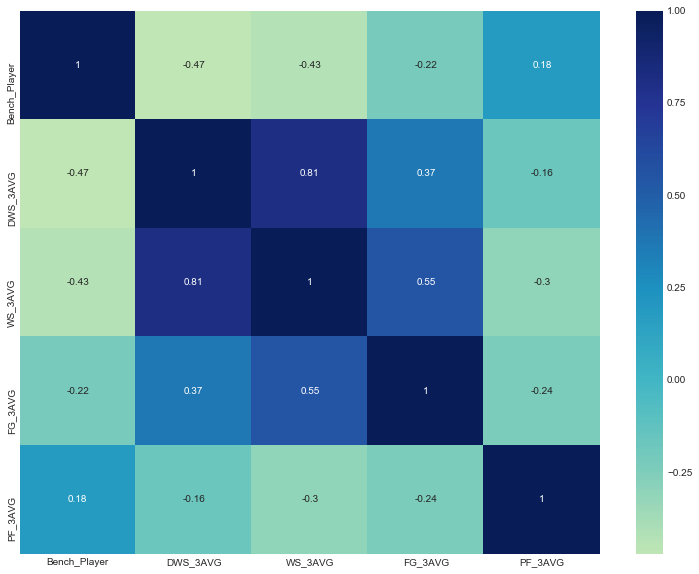

In [279]:
fig, ax = plt.subplots(figsize=(13, 10))

sns.heatmap(DF_Modeling3[['Bench_Player', 'DWS_3AVG', 'WS_3AVG', 'FG_3AVG', 'PF_3AVG']].corr(), 
            annot=True, center=0, cmap="YlGnBu");


In [245]:
DF_Modeling3.shape

(869, 70)

In [246]:
DF_Modeling3[best_predictors].corr()

,Bench_Player,DWS_3AVG,FG_3AVG,OWS_3AVG,PF_3AVG,WS/48_3AVG,WS_3AVG
Bench_Player,1.000000,-0.472446,-0.223603,-0.349866,0.184215,-0.258729,-0.431849
DWS_3AVG,-0.472446,1.000000,0.372042,0.600329,-0.164193,0.621672,0.811687
FG_3AVG,-0.223603,0.372042,1.000000,0.557536,-0.239821,0.452553,0.545894
OWS_3AVG,-0.349866,0.600329,0.557536,1.000000,-0.330038,0.772478,0.954328
PF_3AVG,0.184215,-0.164193,-0.239821,-0.330038,1.000000,-0.057903,-0.302194
WS/48_3AVG,-0.258729,0.621672,0.452553,0.772478,-0.057903,1.000000,0.795609
WS_3AVG,-0.431849,0.811687,0.545894,0.954328,-0.302194,0.795609,1.000000


### Actual vs Predicted

''

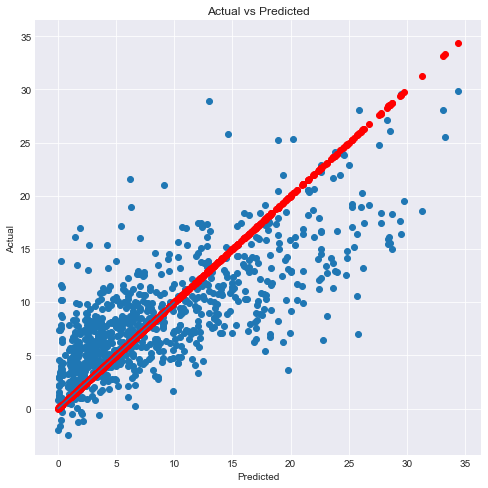

In [281]:
fig, ax = plt.subplots(figsize=(8, 8))

x = np.linspace(0, 10, 35)
plt.plot(x, x, linestyle='-') 
plt.scatter(x="SAL_INFL_M",
           y ="Lasso_CV_Predicted",
           data = DF_Modeling3);

plt.scatter(x="SAL_INFL_M", y="SAL_INFL_M", data=DF_Modeling3, color='r')
plt.title("Actual vs Predicted")
plt.xlabel("Predicted")
plt.ylabel("Actual")
;
# Log_SAL_INFL, SAL_INFL

In [134]:
DF_Modeling3.sort_values('resid')

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,College_Ind,Award_Ind,Pos,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,ORB%_3AVG,DRB%_3AVG,TRB%_3AVG,AST%_3AVG,STL%_3AVG,BLK%_3AVG,TOV%_3AVG,USG%_3AVG,OWS_3AVG,DWS_3AVG,WS_3AVG,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,MP_3AVG,FG_3AVG,FGA_3AVG,FG%_3AVG,3P_3AVG,3PA_3AVG,3P%_3AVG,2P_3AVG,2PA_3AVG,2P%_3AVG,FT_3AVG,FTA_3AVG,FT%_3AVG,ORB_3AVG,DRB_3AVG,TRB_3AVG,AST_3AVG,STL_3AVG,BLK_3AVG,TOV_3AVG,PF_3AVG,PTS_3AVG,Exp_Yrs_Real,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd,Lasso_CV_Predicted,resid,Underpaid
525,"Stephen Curry, PG",Golden State Warriors,12112359.0,2017,STEPHEN CURRY,4x All Star,2015-16 NBA Scoring Champ,Stephen Curry,190.0,75.0,1.0,1.0,PG,26.925000,0.631750,0.481500,0.251250,2.225000,11.700000,7.100000,38.025000,2.600000,0.425000,14.850000,29.525000,1.097500e+01,4.050000,1.510000e+01,0.264000,9.200000,1.000000e-01,9.300000,7.775000e+00,78.333333,78.333333,2797.333333,9.033333,18.766667,0.482000,4.000000,9.133333,0.434000,5.066667,9.633333,0.528000,4.200000,4.700000,0.892667,0.700000,4.000000,4.700000,7.933333,1.833333,0.200000,3.633333,2.366667,26.366667,7.0,0,12.112359,1.296022e+07,12.960224,16.309737,16.377396,0,0,1,0,28.889629,-15.929405,0
1190,"David West, PF",San Antonio Spurs,1499187.0,2016,DAVID WEST,2x All Star,2016-17 NBA Champ,David West,250.0,81.0,1.0,1.0,PF,17.866667,0.528667,0.021333,0.271333,6.300000,18.933333,12.766667,17.666667,1.400000,2.133333,12.300000,22.433333,2.966667e+00,4.166667,7.166667e+00,0.148000,-0.133333,2.500000e+00,2.333333,2.533333e+00,73.000000,73.000000,2267.333333,6.733333,13.866667,0.485667,0.100000,0.300000,0.226000,6.700000,13.600000,0.491000,2.933333,3.833333,0.765333,1.966667,6.266667,8.233333,3.500000,0.966667,1.000000,2.166667,2.633333,16.466667,12.0,0,1.499187,1.924956e+06,1.924956,14.220434,14.470414,0,1,0,0,17.389956,-15.465000,0
168,"Karl-Anthony Towns, C",Minnesota Timberwolves,6216840.0,2018,KARL-ANTHONY TOWNS,2015-16 All-Rookie,2015-16 ROY,Karl-Anthony Towns,244.0,84.0,1.0,1.0,C,24.200000,0.604000,0.131000,0.264000,10.750000,27.650000,19.200000,12.250000,1.000000,3.600000,11.950000,26.200000,7.700000e+00,2.800000,1.050000e+01,0.176000,3.150000,7.000000e-01,3.850000,4.200000e+00,82.000000,82.000000,2828.500000,9.050000,16.700000,0.542000,0.800000,2.250000,0.354000,8.250000,14.450000,0.570500,3.650000,4.450000,0.821500,3.300000,8.500000,11.900000,2.400000,0.750000,1.550000,2.500000,3.150000,22.550000,2.0,0,6.216840,6.216840e+06,6.216840,15.642772,15.642772,1,0,0,0,21.640196,-15.423356,0
1313,"Ty Lawson, PG",Indiana Pacers,211744.0,2016,TY LAWSON,None,None,Ty Lawson,195.0,71.0,1.0,0.0,PG,18.466667,0.543000,0.237000,0.405333,1.700000,7.900000,4.766667,37.133333,2.000000,0.266667,15.200000,21.866667,5.466667e+00,1.433333,6.900000e+00,0.134333,2.866667,-1.600000e+00,1.200000,2.000000e+00,70.000000,69.000000,2466.666667,5.833333,13.166667,0.442667,1.100000,3.133333,0.354333,4.733333,10.033333,0.469667,4.066667,5.333333,0.761333,0.566667,2.566667,3.166667,8.566667,1.433333,0.133333,2.766667,1.800000,16.833333,6.0,0,0.211744,2.718793e+05,0.271879,12.263133,12.513113,0,0,1,0,15.351950,-15.080071,0
351,"Nikola Jokic, C",Denver Nuggets,1471382.0,2018,NIKOLA JOKIC,2015-16 All-Rookie,None,Nikola Jokic,250.0,82.0,0.0,1.0,C,23.900000,0.611000,0.151500,0.292000,11.500000,25.950000,18.700000,23.450000,1.900000,2.200000,14.200000,21.700000,6.100000e+00,2.100000,8.200000e+00,0.206500,4.400000,2.200000e+00,6.600000,4.150000e+00,76.500000,57.000000,1885.500000,7.550000,13.800000,0.545000,0.700000,2.100000,0.328500,6.850000,11.650000,0.584500,3.250000,3.950000,0.818000,3.750000,8.400000,12.150000,5.100000,1.350000,1.000000,2.600000,4.050000,19.050000,2.0,0,1.471382,1.471382e+06,1.471382,14.201713,14.201713,1,0,0,0,15.988515,-14.517133,0
1059,"Damian Lillard, PG",Portland Trail Blazers,4236287.0,2016,DAMIAN LILLARD,2x All Star,2x All-NBA,Damian Lillard,

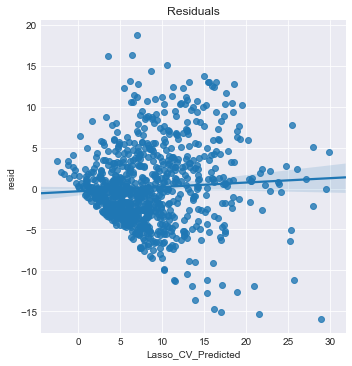

In [258]:
sns.lmplot(x="Lasso_CV_Predicted",
           y ="resid",
           data = DF_Modeling3)
plt.title("Residuals");


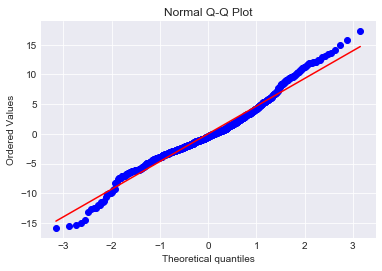

In [136]:
stats.probplot(DF_Modeling3['resid'], dist="norm", plot=plt)
plt.title("Normal Q-Q Plot")
plt.show()

In [67]:
### Create a flag for those that are underpaid or overpaid
# RMSE has been approx $4.5 Million. Potential threshold

def underpaid_flag(row):
    if row['resid'] <= -2:
        val = 1 
    else:
        val = 0
    return val

DF_Modeling3['Underpaid'] = DF_Modeling3.apply(underpaid_flag, axis=1) 


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


In [68]:
DF_Modeling3[DF_Modeling3['Underpaid'] == 1]

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,...,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd,Lasso_CV_Predicted,resid,Underpaid


## Check fit by Variable

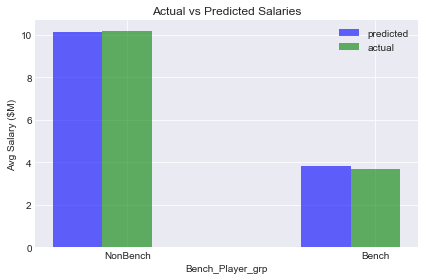

In [234]:
n_groups = 2
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.2
opacity = 0.6

rects1 = plt.bar(index, Bench_Player_grp['Lasso_CV_Predicted'], bar_width,
                 alpha=opacity,
                 color='b',
                 label='predicted')
 
rects2 = plt.bar(index + bar_width, Bench_Player_grp['SAL_INFL_M'], bar_width,
                 alpha=opacity,
                 color='g',
                 label='actual')

plt.xlabel('Bench_Player_grp')
plt.ylabel('Avg Salary ($M)')
plt.title('Actual vs Predicted Salaries')
plt.xticks(index + bar_width, ('NonBench', 'Bench'))
plt.legend()
 
plt.tight_layout()
plt.show()

### Score test data

In [326]:
X_test["Lasso_CV_Predicted"] = lcv.predict(X_test)
#X_test["resid"] = X_test['SAL_INFL_M'] - X_test['Lasso_CV_Predicted']


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [336]:
X_test_predicted = X_test["Lasso_CV_Predicted"]
X_test_predicted = pd.DataFrame(X_test_predicted)

In [337]:
Merge_fit = pd.merge(DF_Modeling3, X_test_predicted, how='inner', left_index=True, right_index=True)


In [338]:
Merge_fit.head()

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,College_Ind,Award_Ind,Pos,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,ORB%_3AVG,DRB%_3AVG,TRB%_3AVG,AST%_3AVG,STL%_3AVG,BLK%_3AVG,TOV%_3AVG,USG%_3AVG,OWS_3AVG,DWS_3AVG,WS_3AVG,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,MP_3AVG,FG_3AVG,FGA_3AVG,FG%_3AVG,3P_3AVG,3PA_3AVG,3P%_3AVG,2P_3AVG,2PA_3AVG,2P%_3AVG,FT_3AVG,FTA_3AVG,FT%_3AVG,ORB_3AVG,DRB_3AVG,TRB_3AVG,AST_3AVG,STL_3AVG,BLK_3AVG,TOV_3AVG,PF_3AVG,PTS_3AVG,Exp_Yrs_Real,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd,Lasso_CV_Predicted_x,resid,Lasso_CV_Predicted_y
6,"Mike Conley, PG",Memphis Grizzlies,28530608.0,2018,MIKE CONLEY,2012-13 All-Defensive,None,Mike Conley,175.0,73.0,1.0,1.0,PG,20.400000,0.566667,0.346000,0.325333,1.533333,9.766667,5.566667,31.733333,2.066667,0.700000,11.633333,24.133333,5.300000,2.100000,7.366667,0.167000,4.466667,-1.066667,3.366667,2.933333,65.000000,64.666667,2092.666667,6.566667,14.766667,0.442667,2.000000,5.166667,0.385667,4.533333,9.633333,0.473000,4.133333,4.833333,0.850667,0.500000,3.000000,3.533333,6.633333,1.400000,0.266667,2.233333,2.066667,19.200000,10.0,0,28.530608,28530608.0,28.530608,17.166488,17.166488,0,0,1,0,15.573104,12.957504,16.086659
20,"Dwight Howard, C",Charlotte Hornets,23500000.0,2018,DWIGHT HOWARD,8x All Star,8x All-NBA,Dwight Howard,265.0,83.0,0.0,1.0,C,19.633333,0.609000,0.006000,0.707667,12.133333,29.900000,21.066667,7.366667,1.333333,3.700000,17.333333,20.300000,2.900000,3.266667,6.166667,0.153000,-1.333333,1.933333,0.566667,1.400000,62.000000,62.000000,1900.666667,6.566667,10.666667,0.615333,0.000000,0.066667,0.166667,6.566667,10.600000,0.618333,3.866667,7.466667,0.516667,3.933333,9.766667,13.766667,1.566667,0.966667,1.633333,2.933333,3.600000,16.933333,13.0,0,23.500000,23500000.0,23.500000,16.972511,16.972511,1,0,0,0,14.144559,9.355441,14.732144
23,"JJ Redick, SG",Philadelphia 76ers,23000000.0,2018,JJ REDICK,None,None,J.J. Redick,190.0,76.0,1.0,0.0,SG,16.166667,0.617667,0.497333,0.225333,0.700000,7.033333,3.966667,8.466667,1.000000,0.333333,8.333333,21.866667,4.800000,1.266667,6.066667,0.131000,2.966667,-2.500000,0.466667,1.400000,77.000000,77.000000,2234.666667,6.800000,14.566667,0.467333,3.233333,7.233333,0.447000,3.566667,7.333333,0.487000,2.900000,3.266667,0.893333,0.233333,2.333333,2.566667,1.866667,0.733333,0.133333,1.433333,2.100000,19.766667,11.0,0,23.000000,23000000.0,23.000000,16.951005,16.951005,0,0,0,0,13.401420,9.598580,13.940670
24,"Brook Lopez, C",Los Angeles Lakers,22642650.0,2018,BROOK LOPEZ,1x All Star,2008-09 All-Rookie,Brook Lopez,275.0,84.0,1.0,1.0,C,21.600000,0.566000,0.117333,0.312333,8.833333,15.866667,12.333333,10.033333,1.033333,4.366667,10.766667,27.600000,4.100000,1.900000,6.033333,0.128333,1.166667,-0.166667,1.000000,1.733333,73.333333,64.000000,2259.666667,8.800000,17.633333,0.499333,0.733333,2.233333,0.196333,8.033333,15.366667,0.522667,4.400000,5.500000,0.803667,2.900000,5.166667,8.033333,2.000000,0.700000,2.000000,2.466667,3.266667,22.700000,9.0,0,22.642650,22642650.0,22.642650,16.935346,16.935346,1,0,0,0,14.988564,7.654086,15.813190
27,"Kevin Love, PF",Cleveland Cavaliers,22642350.0,2018,KEVIN LOVE,4x All Star,2015-16 NBA Champ,Kevin Love,251.0,82.0,1.0,1.0,PF,19.633333,0.562667,0.436667,0.332667,7.466667,28.000000,17.966667,10.900000,1.200000,1.166667,10.733333,23.833333,4.833333,3.033333,7.866667,0.165667,1.800000,-0.033333,1.733333,2.200000,70.666667,70.666667,2280.333333,6.366667,14.866667,0.426667,2.366667,6.500000,0.366667,3.933333,8.366667,0.472667,4.133333,4.966667,0.832333,2.333333,9.133333,11.466667,2.466667,0.866667,0.533333,2.033333,2.266667,19.200000,9.0,0,22.642350,22642350.0,22.642350,16.935333,16.935333,0,1,0,0,16.730944,5.911406,17.422326


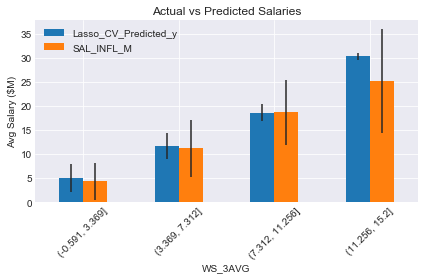

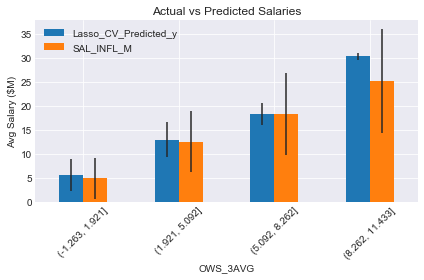

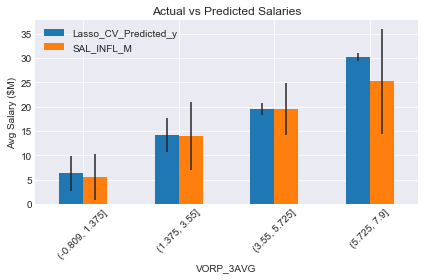

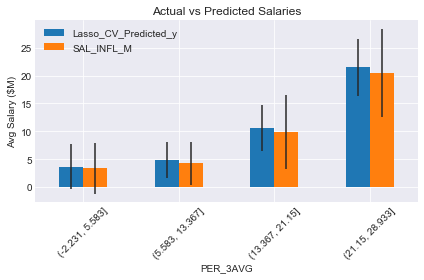

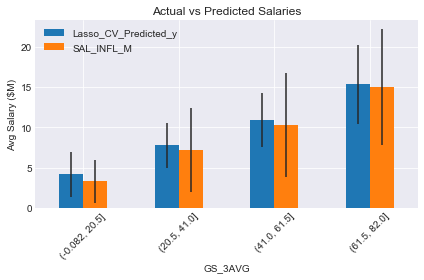

...

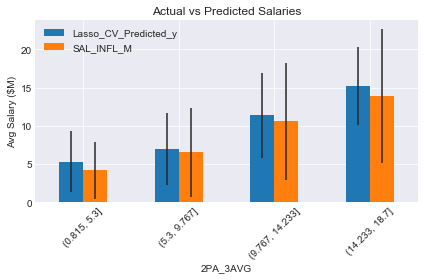

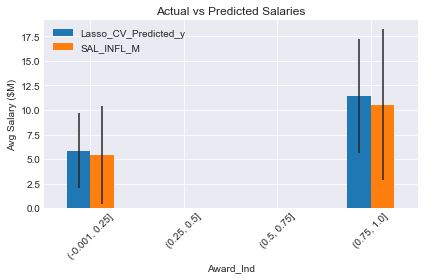

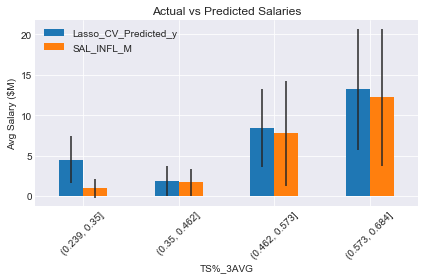

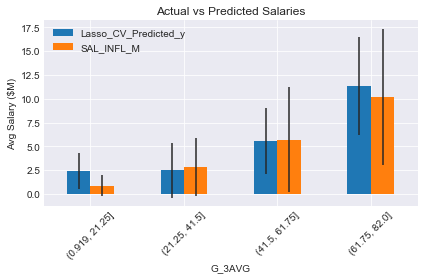

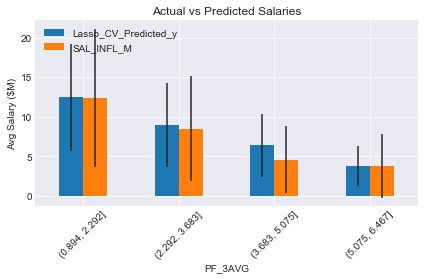

In [339]:
 n_groups = 4

for var in var_keep:
#     Var_grp = DF_Modeling3.groupby(pd.cut(DF_Modeling3[var], n_groups))\
#                     [["Lasso_CV_Predicted","SAL_INFL_M"]].agg(np.mean)
        
    bar_width = 0.2
    opacity = 0.4
    
    errs = Merge_fit.groupby(pd.cut(Merge_fit[var], n_groups))\
                    [["Lasso_CV_Predicted_y","SAL_INFL_M"]].agg(np.std)
    Merge_fit.groupby(pd.cut(Merge_fit[var], n_groups))\
                    [["Lasso_CV_Predicted_y","SAL_INFL_M"]].agg(np.mean).plot(yerr = errs,kind='bar');


    plt.xlabel(var)
    plt.ylabel('Avg Salary ($M)')
    plt.title('Actual vs Predicted Salaries')
    #plt.xticks(index + bar_width, ('Q1', 'Q2','Q3','Q4'))
    plt.xticks(rotation=45)
    plt.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

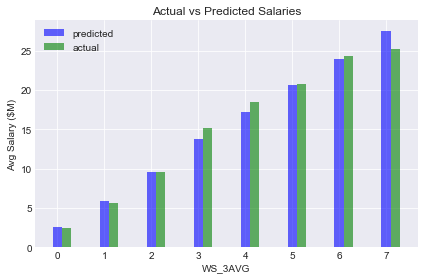

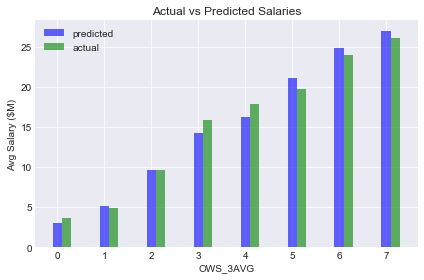

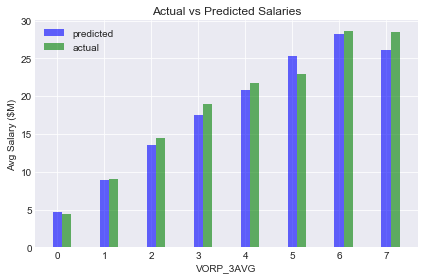

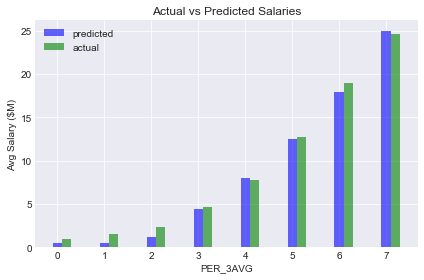

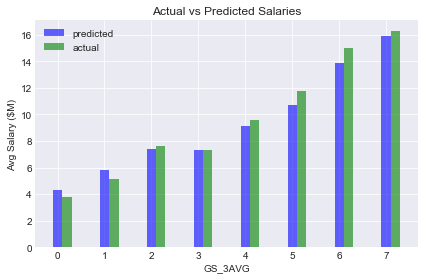

...

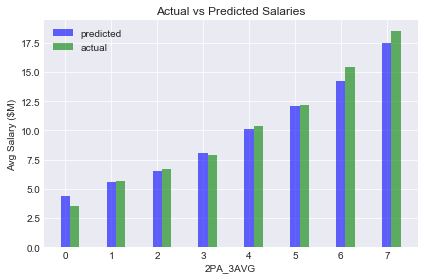

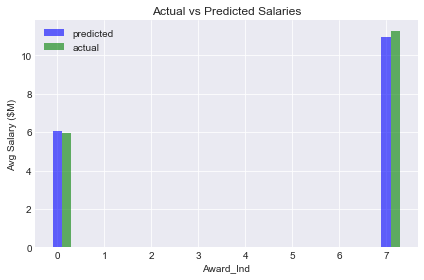

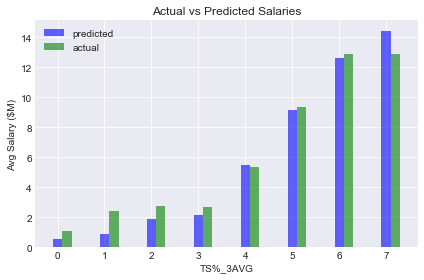

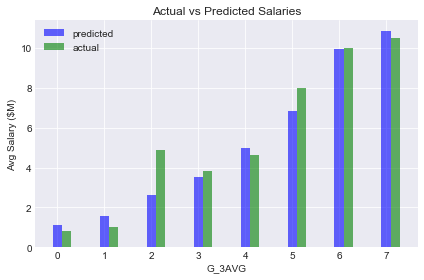

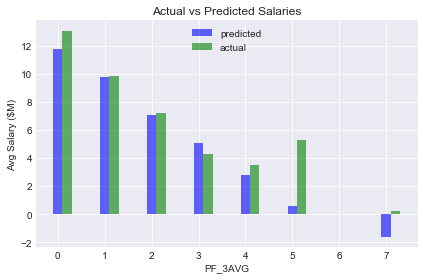

In [341]:
n_groups = 8

for var in var_keep:
    Var_grp = DF_Modeling3.groupby(pd.cut(DF_Modeling3[var], n_groups))\
                    [["Lasso_CV_Predicted","SAL_INFL_M"]].agg(np.mean)
        
    fig, ax = plt.subplots()
    index = np.arange(n_groups)
    bar_width = 0.2
    opacity = 0.6

    rects1 = plt.bar(index, Var_grp['Lasso_CV_Predicted'], bar_width,
                     alpha=opacity,
                     color='b',
                     label='predicted')

    rects2 = plt.bar(index + bar_width, Var_grp['SAL_INFL_M'], bar_width,
                     alpha=opacity,
                     color='g',
                     label='actual')

    plt.xlabel(var)
    plt.ylabel('Avg Salary ($M)')
    plt.title('Actual vs Predicted Salaries')
    #plt.xticks(index + bar_width)
    # plt.xticks(index + bar_width, ('Bucket1', 'Qntile2','Qntile3','Qntile4','Qntile5'))
    plt.legend()

    plt.tight_layout()
    plt.show()


In [61]:
### Create a flag for those that are underpaid or overpaid
# RMSE has been approx $4.5 Million. Potential threshold

def underpaid_flag(row):
    if row['resid'] <= -4.5e6:
        val = 1 
    else:
        val = 0
    return val

DF_Modeling3['Underpaid'] = DF_Modeling3.apply(underpaid_flag, axis=1) 



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


In [130]:
DF_Modeling3[best_predictors].corr()

,Bench_Player,DWS_3AVG,FG_3AVG,OWS_3AVG,PF_3AVG,WS/48_3AVG,WS_3AVG
Bench_Player,1.000000,-0.472446,-0.223603,-0.349866,0.184215,-0.258729,-0.431849
DWS_3AVG,-0.472446,1.000000,0.372042,0.600329,-0.164193,0.621672,0.811687
FG_3AVG,-0.223603,0.372042,1.000000,0.557536,-0.239821,0.452553,0.545894
OWS_3AVG,-0.349866,0.600329,0.557536,1.000000,-0.330038,0.772478,0.954328
PF_3AVG,0.184215,-0.164193,-0.239821,-0.330038,1.000000,-0.057903,-0.302194
WS/48_3AVG,-0.258729,0.621672,0.452553,0.772478,-0.057903,1.000000,0.795609
WS_3AVG,-0.431849,0.811687,0.545894,0.954328,-0.302194,0.795609,1.000000


### Actual vs Predicted

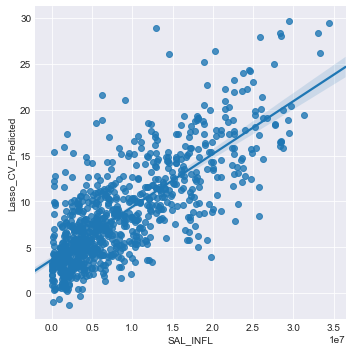

In [133]:
sns.lmplot(x="SAL_INFL",
           y ="Lasso_CV_Predicted",
           data = DF_Modeling3);
# Log_SAL_INFL, SAL_INFL

In [134]:
DF_Modeling3.sort_values('resid')

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,College_Ind,Award_Ind,Pos,PER_3AVG,TS%_3AVG,3PAr_3AVG,FTr_3AVG,ORB%_3AVG,DRB%_3AVG,TRB%_3AVG,AST%_3AVG,STL%_3AVG,BLK%_3AVG,TOV%_3AVG,USG%_3AVG,OWS_3AVG,DWS_3AVG,WS_3AVG,WS/48_3AVG,OBPM_3AVG,DBPM_3AVG,BPM_3AVG,VORP_3AVG,G_3AVG,GS_3AVG,MP_3AVG,FG_3AVG,FGA_3AVG,FG%_3AVG,3P_3AVG,3PA_3AVG,3P%_3AVG,2P_3AVG,2PA_3AVG,2P%_3AVG,FT_3AVG,FTA_3AVG,FT%_3AVG,ORB_3AVG,DRB_3AVG,TRB_3AVG,AST_3AVG,STL_3AVG,BLK_3AVG,TOV_3AVG,PF_3AVG,PTS_3AVG,Exp_Yrs_Real,Bench_Player,SALARY_M,SAL_INFL,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd,Lasso_CV_Predicted,resid,Underpaid
525,"Stephen Curry, PG",Golden State Warriors,12112359.0,2017,STEPHEN CURRY,4x All Star,2015-16 NBA Scoring Champ,Stephen Curry,190.0,75.0,1.0,1.0,PG,26.925000,0.631750,0.481500,0.251250,2.225000,11.700000,7.100000,38.025000,2.600000,0.425000,14.850000,29.525000,1.097500e+01,4.050000,1.510000e+01,0.264000,9.200000,1.000000e-01,9.300000,7.775000e+00,78.333333,78.333333,2797.333333,9.033333,18.766667,0.482000,4.000000,9.133333,0.434000,5.066667,9.633333,0.528000,4.200000,4.700000,0.892667,0.700000,4.000000,4.700000,7.933333,1.833333,0.200000,3.633333,2.366667,26.366667,7.0,0,12.112359,1.296022e+07,12.960224,16.309737,16.377396,0,0,1,0,28.889629,-15.929405,0
1190,"David West, PF",San Antonio Spurs,1499187.0,2016,DAVID WEST,2x All Star,2016-17 NBA Champ,David West,250.0,81.0,1.0,1.0,PF,17.866667,0.528667,0.021333,0.271333,6.300000,18.933333,12.766667,17.666667,1.400000,2.133333,12.300000,22.433333,2.966667e+00,4.166667,7.166667e+00,0.148000,-0.133333,2.500000e+00,2.333333,2.533333e+00,73.000000,73.000000,2267.333333,6.733333,13.866667,0.485667,0.100000,0.300000,0.226000,6.700000,13.600000,0.491000,2.933333,3.833333,0.765333,1.966667,6.266667,8.233333,3.500000,0.966667,1.000000,2.166667,2.633333,16.466667,12.0,0,1.499187,1.924956e+06,1.924956,14.220434,14.470414,0,1,0,0,17.389956,-15.465000,0
168,"Karl-Anthony Towns, C",Minnesota Timberwolves,6216840.0,2018,KARL-ANTHONY TOWNS,2015-16 All-Rookie,2015-16 ROY,Karl-Anthony Towns,244.0,84.0,1.0,1.0,C,24.200000,0.604000,0.131000,0.264000,10.750000,27.650000,19.200000,12.250000,1.000000,3.600000,11.950000,26.200000,7.700000e+00,2.800000,1.050000e+01,0.176000,3.150000,7.000000e-01,3.850000,4.200000e+00,82.000000,82.000000,2828.500000,9.050000,16.700000,0.542000,0.800000,2.250000,0.354000,8.250000,14.450000,0.570500,3.650000,4.450000,0.821500,3.300000,8.500000,11.900000,2.400000,0.750000,1.550000,2.500000,3.150000,22.550000,2.0,0,6.216840,6.216840e+06,6.216840,15.642772,15.642772,1,0,0,0,21.640196,-15.423356,0
1313,"Ty Lawson, PG",Indiana Pacers,211744.0,2016,TY LAWSON,None,None,Ty Lawson,195.0,71.0,1.0,0.0,PG,18.466667,0.543000,0.237000,0.405333,1.700000,7.900000,4.766667,37.133333,2.000000,0.266667,15.200000,21.866667,5.466667e+00,1.433333,6.900000e+00,0.134333,2.866667,-1.600000e+00,1.200000,2.000000e+00,70.000000,69.000000,2466.666667,5.833333,13.166667,0.442667,1.100000,3.133333,0.354333,4.733333,10.033333,0.469667,4.066667,5.333333,0.761333,0.566667,2.566667,3.166667,8.566667,1.433333,0.133333,2.766667,1.800000,16.833333,6.0,0,0.211744,2.718793e+05,0.271879,12.263133,12.513113,0,0,1,0,15.351950,-15.080071,0
351,"Nikola Jokic, C",Denver Nuggets,1471382.0,2018,NIKOLA JOKIC,2015-16 All-Rookie,None,Nikola Jokic,250.0,82.0,0.0,1.0,C,23.900000,0.611000,0.151500,0.292000,11.500000,25.950000,18.700000,23.450000,1.900000,2.200000,14.200000,21.700000,6.100000e+00,2.100000,8.200000e+00,0.206500,4.400000,2.200000e+00,6.600000,4.150000e+00,76.500000,57.000000,1885.500000,7.550000,13.800000,0.545000,0.700000,2.100000,0.328500,6.850000,11.650000,0.584500,3.250000,3.950000,0.818000,3.750000,8.400000,12.150000,5.100000,1.350000,1.000000,2.600000,4.050000,19.050000,2.0,0,1.471382,1.471382e+06,1.471382,14.201713,14.201713,1,0,0,0,15.988515,-14.517133,0
1059,"Damian Lillard, PG",Portland Trail Blazers,4236287.0,2016,DAMIAN LILLARD,2x All Star,2x All-NBA,Damian Lillard,

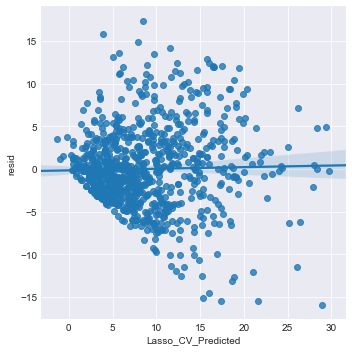

In [135]:
sns.lmplot(x="Lasso_CV_Predicted",
           y ="resid",
           data = DF_Modeling3);


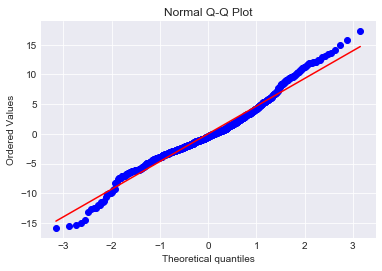

In [136]:
stats.probplot(DF_Modeling3['resid'], dist="norm", plot=plt)
plt.title("Normal Q-Q Plot")
plt.show()

In [67]:
### Create a flag for those that are underpaid or overpaid
# RMSE has been approx $4.5 Million. Potential threshold

def underpaid_flag(row):
    if row['resid'] <= -2:
        val = 1 
    else:
        val = 0
    return val

DF_Modeling3['Underpaid'] = DF_Modeling3.apply(underpaid_flag, axis=1) 


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


In [68]:
DF_Modeling3[DF_Modeling3['Underpaid'] == 1]

,NAME,TEAM,SALARY,Contract_Yr,Player_Match,bling1,bling2,name,weight,height_in,...,SAL_INFL_M,Log_SAL,Log_SAL_INFL,Center,PowerFwd,PointG,SmallFwd,Lasso_CV_Predicted,resid,Underpaid


In [69]:
X_mult_all.columns

NameError: name 'X_mult_all' is not defined

In [624]:
y = DF_Modeling3['Underpaid']


In [492]:
X_train, X_test, y_train, y_test = train_test_split(X_mult_all, y, test_size=0.4, random_state=20)

In [493]:
decision_tree = DecisionTreeRegressor(max_depth=2)
decision_tree.fit(X_train, y_train)
print( "Decision Tree RMSE:", np.sqrt(mean_squared_error(y_test,decision_tree.predict(X_test))))

Decision Tree RMSE: 0.0


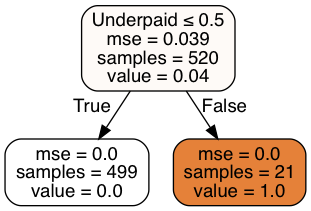

In [494]:
dot_data = StringIO()  
export_graphviz(decision_tree, out_file=dot_data,  
                    feature_names=X_train.columns.tolist(),  
                    filled=True, rounded=True,  
                    special_characters=True)  
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Plot Avg Predicted Output by the Features